<a href="https://colab.research.google.com/github/mushroom3969/NTHU_Data_Science/blob/main/Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Download Data

- train : https://github.com/mushroom3969/NTHU_Data_Science/raw/main/classification/data/train.csv
- test : https://github.com/mushroom3969/NTHU_Data_Science/raw/main/classification/data/test.csv
- random_baseline : https://github.com/mushroom3969/NTHU_Data_Science/raw/main/classification/data/random_baseline.csv

In [1]:
from pathlib import Path
import requests

def download_data(path, name, url):
  data_path = Path(path)
  if data_path.is_dir():
    print(f"{data_path} directory exist.")
  else:
    print(f"Creating {data_path}")
    data_path.mkdir(parents=True, exist_ok=True)

  with open(data_path / name, "wb") as f:
    req = requests.get(url)
    print("Downloading data...")
    f.write(req.content)

url1 = "https://github.com/mushroom3969/NTHU_Data_Science/raw/main/classification/data/train.csv"
url2 = "https://github.com/mushroom3969/NTHU_Data_Science/raw/main/classification/data/test.csv"
url3 = "https://github.com/mushroom3969/NTHU_Data_Science/raw/main/classification/data/random_baseline.csv"

download_data("./data", "train.csv", url1)
download_data("./data", "test.csv", url2)
download_data("./data", "random_baseline.csv", url3)

data directory exist.
data directory exist.
data directory exist.


# 2. Data Cleaning

In [2]:
import pandas as pd

ori_df = pd.read_csv(Path("./data/train.csv"))
ori_df.shape

(85270, 22)

In [3]:
# Check NA value
ori_df.isna().apply(sum, axis=0)

col_1              0
col_2              0
col_3              0
col_4          12817
col_5              0
col_6              0
col_7              0
col_8              0
col_9              0
col_10          6004
col_11          1799
col_12          1661
col_13             0
col_14             0
col_15             0
col_16             0
col_17             0
col_18             0
col_19          3836
col_20          6502
col_21          1024
CreditScore        0
dtype: int64

In [4]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import iplot


v1_df = ori_df
v1_df.head()

,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,...,col_13,col_14,col_15,col_16,col_17,col_18,col_19,col_20,col_21,CreditScore
0,22,14,8557.39,797.115833,8,6,22,2,37,15.0,...,0,1767.29,25.400823,143,2,13.168404,91.952879,3.0,264.590301,2
1,37,1,19718.92,1676.243333,10,9,19,6,27,11.0,...,2,2057.56,28.642449,197,2,64.066440,107.668408,3.0,285.889485,2
2,33,13,32045.78,2677.481667,6,9,30,7,10,10.0,...,2,1333.18,30.053861,76,2,169.770374,62.681178,4.0,285.296615,2
3,42,4,62976.28,5321.023333,0,3,12,0,9,0.0,...,1,68.66,40.661773,191,1,0.000000,70.780837,4.0,711.321496,1
4,39,2,57818.72,4864.226667,7,7,21,2,56,16.0,...,0,2348.77,37.882655,174,2,73.709570,395.136222,3.0,307.576874,2


In [5]:
v1_df.shape

(85270, 22)

In [6]:
def na_hist(df):
  trace1 = go.Histogram(x = df)
  data = [trace1]
  layout = go.Layout()
  fig = go.Figure(data = data, layout = layout)
  iplot(fig)

## 1. col_4

- numeric

In [7]:
na_4_df = v1_df[v1_df["col_4"].isna()]

In [8]:
na_hist(ori_df.col_4)

## Col_10

In [9]:
v1_df[v1_df["col_10"].isna()]

,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,...,col_13,col_14,col_15,col_16,col_17,col_18,col_19,col_20,col_21,CreditScore
38,55,1,54740.38,4395.698333,3,4,7,0,5,NaN,...,2,1101.31,28.032134,324,0,0.000000,109.566237,1.0,600.003596,0
45,26,15,54811.56,4510.630000,4,5,11,6,24,NaN,...,3,2170.62,26.746032,225,2,171.341400,174.490913,3.0,395.230687,0
52,14,14,11253.46,808.788333,3,6,6,4,25,NaN,...,2,1381.81,33.719367,190,2,32.591082,73.497658,3.0,264.790094,0
80,27,3,81864.56,6882.046667,8,5,11,2,6,NaN,...,2,1210.87,30.677248,242,2,74.807701,692.151425,2.0,201.245540,0
82,39,9,59612.64,5067.720000,6,5,32,7,60,NaN,...,3,4764.40,31.419680,39,2,283.733432,209.171608,4.0,263.866960,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85202,19,0,38047.79,3344.649167,0,4,12,2,14,NaN,...,1,186.72,34.833140,350,0,61.700274,99.006650,NaN,423.757993,2
85223,14,11,28417.58,2365.131667,6,8,27,8,39,NaN,...,0,3131.45,27.421268,49,2,125.357122,137.783478,3.0,263.372566,2
85239,32,15,100310.08,NaN,3,3,5,1,10,NaN,...,3,904.83,32.020786,274,2,47.043076,323.211155,4.0,711.763102,0
85249,38,10,115012.40,9838.366667,2,2,8,2,16,NaN,...,1,306.90,37.594224,391,1,173.218937,143.859335,5.0,906.758395,0


In [10]:
na_hist(ori_df.col_10)

## Col 11

In [11]:
v1_df[v1_df["col_11"].isna()]

,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,...,col_13,col_14,col_15,col_16,col_17,col_18,col_19,col_20,col_21,CreditScore
1,37,1,19718.920,1676.243333,10,9,19,6,27,11.0,...,2,2057.56,28.642449,197,2,64.066440,107.668408,3.0,285.889485,2
48,25,3,67394.920,5844.243333,4,3,21,7,28,18.0,...,2,1687.02,36.074169,110,2,341.566903,710.581000,3.0,NaN,2
83,29,7,59962.520,4976.876667,3,7,28,5,26,12.0,...,2,2660.36,34.170641,207,2,140.262838,120.569300,NaN,506.855529,2
110,22,0,37467.180,2920.265000,6,7,34,6,32,23.0,...,3,2607.00,39.926632,73,2,117.335650,NaN,4.0,386.652779,2
122,35,3,18753.340,1623.778333,5,4,11,4,25,12.0,...,2,2575.62,37.243646,180,2,54.396270,116.517764,2.0,271.463799,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85082,41,4,71766.060,5968.505000,8,4,1091,4,5,11.0,...,2,940.66,34.377334,270,0,198.309054,201.365596,4.0,447.175850,1
85100,51,14,31527.530,NaN,6,3,11,1,27,10.0,...,3,1063.18,40.725937,247,0,16.260074,96.372156,4.0,422.697187,0
85121,24,15,10357.485,1105.781183,9,7,27,7,32,NaN,...,0,2415.22,38.612789,199,2,114.371075,113.198199,NaN,226.085668,2
85141,38,0,141733.080,11570.090000,5,5,20,6,12,19.0,...,3,291.88,32.260343,237,2,495.839491,153.210549,5.0,747.958960,1


In [12]:
na_hist(ori_df.col_11)

## Col 12

In [13]:
v1_df[v1_df["col_12"].isna()]

,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,...,col_13,col_14,col_15,col_16,col_17,col_18,col_19,col_20,col_21,CreditScore
130,22,3,97034.960,7828.246667,3,3,11,5,21,15.0,...,2,86.68,35.437442,151,2,246.529694,10000.000000,5.0,634.871513,0
147,22,11,87520.660,7142.388333,0,5,1,4,0,5.0,...,1,1167.75,33.166770,291,1,149.599343,634.553996,2.0,210.085494,1
211,27,2,32701.560,2930.130000,2,3,8,2,13,6.0,...,1,1070.74,36.004535,357,1,45.402765,NaN,3.0,229.810936,0
218,27,9,20987.560,1766.963333,10,7,34,7,39,25.0,...,0,2553.42,33.189156,199,0,55694.000000,155.166693,3.0,206.927546,2
274,35,1,11840.105,763.675417,7,4,20,2,7,15.0,...,3,1259.92,35.529150,256,2,10.135246,34.266137,2.0,311.966158,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85191,25,6,26175.310,NaN,8,4,11,0,10,8.0,...,2,601.78,27.312197,111,2,0.000000,52.217770,1.0,435.309813,0
85202,19,0,38047.790,3344.649167,0,4,12,2,14,NaN,...,1,186.72,34.833140,350,0,61.700274,99.006650,NaN,423.757993,2
85223,14,11,28417.580,2365.131667,6,8,27,8,39,NaN,...,0,3131.45,27.421268,49,2,125.357122,137.783478,3.0,263.372566,2
85228,15,3,9848.320,629.693333,356,7,9,6,8,10.0,...,2,227.88,37.482986,111,2,32.117024,NaN,3.0,239.506388,0


In [14]:
na_hist(ori_df.col_12)

## Col 19

In [15]:
v1_df[v1_df["col_19"].isna()]

,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,...,col_13,col_14,col_15,col_16,col_17,col_18,col_19,col_20,col_21,CreditScore
74,42,10,131908.240,11162.353333,4,4,20,0,20,9.0,...,2,344.86,43.059753,256,1,0.000000,NaN,5.0,1179.469952,1
98,43,10,12993.970,1223.830833,6,6,14,7,15,9.0,...,2,488.79,30.729799,159,2,64.896714,NaN,3.0,261.510474,0
110,22,0,37467.180,2920.265000,6,7,34,6,32,23.0,...,3,2607.00,39.926632,73,2,117.335650,NaN,4.0,386.652779,2
172,19,2,7908.935,644.077917,9,5,32,3,34,16.0,...,0,1840.31,23.146217,172,2,18.178506,NaN,3.0,285.332059,2
178,28,9,7477.175,713.097917,9,5,15,8,55,22.0,...,3,4944.58,36.125353,88,0,35.180443,NaN,3.0,288.762718,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85174,45,14,36479.270,3241.939167,1,7,7,2,12,7.0,...,1,719.70,34.400409,365,1,44.375759,NaN,3.0,366.869891,0
85178,27,7,90661.350,7346.112500,8,3,11,2,29,9.0,...,2,1375.13,32.290417,189,2,113.126298,NaN,3.0,367.208375,0
85199,24,5,21453.930,1600.827500,6,4,9,0,26,14.0,...,2,162.76,27.892206,396,1,0.000000,NaN,3.0,245.586170,0
85228,15,3,9848.320,629.693333,356,7,9,6,8,10.0,...,2,227.88,37.482986,111,2,32.117024,NaN,3.0,239.506388,0


In [16]:
na_hist(ori_df.col_19)

## Col 20

In [17]:
v1_df[v1_df["col_20"].isna()]

,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,...,col_13,col_14,col_15,col_16,col_17,col_18,col_19,col_20,col_21,CreditScore
26,33,3,14917.845,1522.153750,1,7,6,2,13,3.0,...,1,609.71,32.424535,207,1,17.707816,150.763317,NaN,273.744242,0
36,28,4,40334.700,3313.225000,9,7,26,2,59,17.0,...,0,1274.12,33.409161,180,2,45.341401,297.590867,NaN,278.390232,2
83,29,7,59962.520,4976.876667,3,7,28,5,26,12.0,...,2,2660.36,34.170641,207,2,140.262838,120.569300,NaN,506.855529,2
105,28,12,31461.840,NaN,7,1071,12,5,28,14.0,...,2,886.09,31.434739,121,0,68.758649,45.957342,NaN,425.666008,0
151,39,14,31369.580,NaN,8,9,27,8,27,22.0,...,0,4259.91,22.784843,143,2,171.748418,328.064681,NaN,50.900067,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85226,50,9,75520.470,NaN,4,7,13,4,12,12.0,...,2,1447.18,32.060088,270,0,167.791469,53.871720,NaN,659.374061,0
85245,35,13,128189.370,10390.447500,2,7,7,2,8,1.0,...,1,913.10,38.733777,371,1,153.269009,363.628046,NaN,782.147695,1
85258,45,3,29378.060,2312.171667,7,6,17,4,19,8.0,...,2,1078.84,25.661255,218,2,93.017293,183.844990,NaN,244.354883,2
85262,39,9,33480.020,2775.001667,8,10,19,9,58,17.0,...,3,4177.98,36.045289,43,2,128.095706,178.672637,NaN,260.731824,2


In [18]:
na_hist(ori_df.col_20)

## Col 21

In [19]:
v1_df[v1_df["col_21"].isna()]

,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,...,col_13,col_14,col_15,col_16,col_17,col_18,col_19,col_20,col_21,CreditScore
48,25,3,67394.92,5844.243333,4,3,21,7,28,18.0,...,2,1687.02,36.074169,110,2,341.566903,710.581000,3.0,NaN,2
234,43,0,62109.24,5152.770000,5,4,15,4,29,11.0,...,3,1308.94,30.921636,330,2,166.158548,653.960134,3.0,NaN,0
325,22,9,83334.50,6918.541667,5,3,3,3,5,5.0,...,3,1188.93,26.159698,234,1,168.131731,815.566664,3.0,NaN,0
509,28,2,65500.84,5457.403333,4,3,18,4,8,13.0,...,2,1088.57,36.004487,389,1,197.567086,655.887609,NaN,NaN,0
521,19,1,61632.99,4856.082500,9,9,27,7,34,23.0,...,0,1634.98,36.369384,118,2,311.564961,472.647627,2.0,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84875,40,5,73678.88,6362.906667,10,9,22,9,55,25.0,...,3,4936.75,23.280438,9,2,367.553576,NaN,2.0,NaN,0
84931,51,5,97976.08,8136.673333,8,6,12,2,16,8.0,...,3,1113.49,34.214581,338,2,115.087325,1039.373998,3.0,NaN,0
84993,38,8,122760.66,10422.055000,0,4,4,3,25,9.0,...,1,707.79,31.685765,211,0,243.774553,1179.335590,3.0,NaN,0
85046,45,11,118879.68,9641.640000,5,3,15,6,12,17.0,...,2,233.76,38.104229,215,2,330.621437,1207.180684,3.0,NaN,0


In [20]:
na_hist(ori_df.col_21)

In [21]:
# Calculate the median for each column
median_col_4 = v1_df["col_4"].median()
median_col_10 = v1_df["col_10"].median()
median_col_11 = v1_df["col_11"].median()
median_col_12 = v1_df["col_12"].median()
median_col_19 = v1_df["col_19"].median()
median_col_21 = v1_df["col_21"].median()

# Fill missing values using calculated medians
v1_df = v1_df.assign(
    col_4 = v1_df["col_4"].fillna(median_col_4),
    col_10 = v1_df["col_10"].fillna(median_col_10),
    col_11 = v1_df["col_11"].fillna(median_col_11),
    col_12 = v1_df["col_12"].fillna(median_col_12),
    col_19 = v1_df["col_19"].fillna(median_col_19),
    col_20 = v1_df["col_20"].fillna(value=-1),
    col_21 = v1_df["col_21"].fillna(median_col_21)
)

v1_df.isna().apply(sum, axis=0)

col_1          0
col_2          0
col_3          0
col_4          0
col_5          0
col_6          0
col_7          0
col_8          0
col_9          0
col_10         0
col_11         0
col_12         0
col_13         0
col_14         0
col_15         0
col_16         0
col_17         0
col_18         0
col_19         0
col_20         0
col_21         0
CreditScore    0
dtype: int64

# Data Observe

In [22]:
na_hist(v1_df.CreditScore)

In [23]:
X, y = v1_df.iloc[:, :-1], v1_df.iloc[:, -1]

In [24]:
from sklearn.model_selection import train_test_split


test_size = int(len(v1_df) * 0.2)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=test_size, random_state=42
)

X_train.shape, X_test.shape, y_train.shape, y_test.shape


((68216, 21), (17054, 21), (68216,), (17054,))

# V1

## Data preprocessing

In [48]:

num = ["col_1", "col_3", "col_4","col_5","col_6","col_7","col_8","col_9","col_10","col_11","col_12","col_14","col_15","col_16","col_18","col_19","col_21"]
cat = ["col_2", "col_13", "col_17", "col_20"]


from imblearn.over_sampling import SMOTE, ADASYN

#X, y = SMOTE().fit_resample(X, y)
X, y = ADASYN().fit_resample(X_train, y_train)

X.shape, y

((109446, 21),
 0         0
 1         1
 2         2
 3         0
 4         1
          ..
 109441    2
 109442    2
 109443    2
 109444    2
 109445    2
 Name: CreditScore, Length: 109446, dtype: int64)

## Model-XGBOOST

In [47]:
from xgboost import XGBClassifier


xgb = Pipeline(steps=[('classifier', XGBClassifier(random_state=42))])

xgb.fit(X, y)

Pipeline(steps=[('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None,
                               objective='multi:softprob', ...))])

In [156]:
from sklearn.model_selection import GridSearchCV

param_grid = {"classifier__n_estimators" : [300],
              "classifier__learning_rate" : [0.3],
              "classifier__min_child_weight" : [1],
              "classifier__max_depth" : [9],
              "classifier__subsample" : [0.5],
              "classifier__colsample_bytree" : [1]
              }

grid_xgb = GridSearchCV(xgb, param_grid=param_grid, cv=5)
grid_xgb.fit(X, y)


print(f"Best parameters: {grid_xgb.best_params_}")
print(f"Best cross-validation score: {grid_xgb.best_score_:.2f}")

Best parameters: {'classifier__colsample_bytree': 1, 'classifier__learning_rate': 0.3, 'classifier__max_depth': 9, 'classifier__min_child_weight': 1, 'classifier__n_estimators': 300, 'classifier__subsample': 0.5}
Best cross-validation score: 0.83


In [158]:
y_pred = pd.DataFrame(grid.predict(X_test))

pred_evalutation(y_test, y_pred)


accuracy
0.78:

recall:
0.78

f1:
0.78



## Model - PCA + XGBOOST

In [62]:
from xgboost import XGBClassifier
from sklearn.decomposition import PCA

xgb_pca = Pipeline(steps=[
    ("reduction", PCA())
    ,('classifier', XGBClassifier(random_state=42))])

xgb_pca.fit(X, y)

Pipeline(steps=[('reduction', PCA()),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None,
                               objective='multi:softprob', ...))])

In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid = {
              "classifier__n_estimators" : [300],
              "classifier__learning_rate" : [0.3],
              "classifier__min_child_weight" : [1],
              "classifier__max_depth" : [9],
              "classifier__subsample" : [0.5],
              "classifier__colsample_bytree" : [1]
              }

grid_xgb_pca = GridSearchCV(xgb, param_grid=param_grid, cv=5)
grid_xgb_pca.fit(X, y)


print(f"Best parameters: {grid_xgb_pca.best_params_}")
print(f"Best cross-validation score: {grid_xgb_pca.best_score_:.2f}")

In [63]:
y_pred = pd.DataFrame(xgb_pca.predict(X_test))

pred_evalutation(y_test, y_pred)

accuracy
0.70:

recall:
0.70

f1:
0.70



## Model - RFT

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = Pipeline(steps=[('classifier', RandomForestClassifier(random_state=42))])

rf.fit(X, y)

In [ ]:
from sklearn.model_selection import GridSearchCV


param_grid = {"classifier__n_estimators" : [50, 100, 200,],
              "classifier__criterion" : ["gini", "entropy"]
              }

grid = GridSearchCV(rf, param_grid=param_grid, cv=5)
grid.fit(X, y)


print(f"Best parameters: {grid.best_params_}")
print(f"Best cross-validation score: {grid.best_score_:.2f}")

## Model-SVD

In [166]:
from sklearn.svm import SVC

from sklearn.pipeline import Pipeline            # 用以包裝成pipeline
from sklearn.compose import ColumnTransformer    # 用以整合欄位進行轉換
from sklearn.impute import SimpleImputer         # 用以進行補值前處理
from sklearn.preprocessing import StandardScaler # 用以進行標準化前處理
from sklearn.preprocessing import OneHotEncoder  # 用以進行編碼前處理

numeric_transformer = Pipeline(steps=[
    ("scalar", StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))])




preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, num),
        ('cat', categorical_transformer, cat),
    ],
    remainder='passthrough'
    )




In [ ]:
svc = Pipeline(steps=[('preprocessor', preprocessor),
                         ('classifier', SVC())])

svc.fit(X, y)


In [ ]:
from sklearn.model_selection import GridSearchCV


param_grid = {"classifier__kernel" : ["rbf"],
              "classifier__C" : [0.1, 1, 10],
              "classifier__gamma" : ['auto', 'scale']}

grid_svc = GridSearchCV(svc, param_grid=param_grid, cv=5)
grid_svc.fit(X, y)


print(f"Best parameters: {grid_svc.best_params_}")
print(f"Best cross-validation score: {grid_svc.best_score_:.2f}")

In [ ]:
y_pred = pd.DataFrame(grid.predict(X_test))

pred_evalutation(y_test, y_pred)

## Model-K nearest

In [58]:
from sklearn.svm import SVC

from sklearn.pipeline import Pipeline            # 用以包裝成pipeline
from sklearn.compose import ColumnTransformer    # 用以整合欄位進行轉換
from sklearn.impute import SimpleImputer         # 用以進行補值前處理
from sklearn.preprocessing import StandardScaler # 用以進行標準化前處理
from sklearn.preprocessing import OneHotEncoder  # 用以進行編碼前處理

numeric_transformer = Pipeline(steps=[
    ("scalar", StandardScaler())
])





num = ["col_1", "col_3", "col_4","col_5","col_6","col_7","col_8","col_9","col_10","col_11","col_12","col_14","col_15","col_16","col_18","col_19","col_21"]
cat = ["col_2", "col_13", "col_17", "col_20"]


preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, num),
    ],
    remainder='passthrough'
    )



In [54]:
X

,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,...,col_12,col_13,col_14,col_15,col_16,col_17,col_18,col_19,col_20,col_21
0,36,9,103221.210000,3062.501667,5,5,7,2,26,16.000000,...,5.000000,2,1256.480000,39.143250,326,2,136.709553,367.696218,4.000000,615.570979
1,53,4,160591.240000,3062.501667,3,5,12,4,11,2.000000,...,3.000000,1,71.770000,26.157705,400,1,78278.000000,1785.786788,-1.000000,335.021763
2,31,2,43900.020000,3062.501667,8,1229,30,4,15,16.000000,...,11.000000,2,2597.200000,31.956605,186,2,111.519608,119.210678,0.000000,384.103214
3,36,13,42052.740000,3790.395000,7,7,8,3,26,19.000000,...,8.000000,3,444.770000,39.579852,164,0,66.535083,155.495728,1.000000,427.008689
4,6048,8,37302.100000,3062.501667,3,2,12,4,13,12.000000,...,1.000000,1,907.730000,39.229565,263,1,80.271752,104.543310,4.000000,397.235771
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109441,50,2,110961.077871,9207.166206,5,7,3,1,20,10.170409,...,0.723470,2,349.240530,29.498609,338,0,75.716347,567.529841,3.723470,549.383691
109442,51,2,110823.319530,9279.863596,4,6,4,2,17,14.060532,...,1.731580,3,252.466934,36.120132,305,0,181.222455,791.393009,3.000000,245.370895
109443,26,14,59390.400000,4948.200000,9,938,29,5,21,23.000000,...,14.000000,2,4363.440000,37.105420,116,2,204.805440,121.023894,4.660101,417.488152
109444,30,10,69206.488732,3062.501667,4,4,30,3,13,14.792315,...,6.224039,1,1507.226824,27.379294,132,2,162.924932,480.012786,-0.327882,284.061969


In [59]:
from sklearn.neighbors import KNeighborsClassifier

kn = Pipeline(steps=[('preprocessor', preprocessor),
                         ('classifier', KNeighborsClassifier(n_neighbors=3))])

kn.fit(X, y)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('scalar',
                                                                   StandardScaler())]),
                                                  ['col_1', 'col_3', 'col_4',
                                                   'col_5', 'col_6', 'col_7',
                                                   'col_8', 'col_9', 'col_10',
                                                   'col_11', 'col_12', 'col_14',
                                                   'col_15', 'col_16', 'col_18',
                                                   'col_19', 'col_21'])])),
                ('classifier', KNeighborsClassifier(n_neighbors=3))])

In [ ]:
from sklearn.model_selection import GridSearchCV


param_grid = {"classifier__n_neighbors" : [3, 5],
              }

grid_kn = GridSearchCV(kn, param_grid=param_grid, cv=5)
grid.fit(X, y)


print(f"Best parameters: {grid.best_params_}")
print(f"Best cross-validation score: {grid.best_score_:.2f}")

Best parameters: {'classifier__n_neighbors': 5}
Best cross-validation score: 0.64


In [60]:
y_pred = pd.DataFrame(kn.predict(X_test))

pred_evalutation(y_test, y_pred)


accuracy
0.59:

recall:
0.59

f1:
0.59



## Feature Selection

### ElasticNet

In [ ]:
from sklearn.linear_model import ElasticNet

e_net = ElasticNet(alpha = 1)
e_net.fit(X, y)

coef=pd.Series(e_net.coef_,index=X.columns)
coef

col_1    -0.000000e+00
col_2     0.000000e+00
col_3    -3.880324e-09
col_4    -4.124369e-06
col_5     0.000000e+00
col_6     2.357304e-06
col_7     7.458458e-07
col_8    -0.000000e+00
col_9     4.561888e-03
col_10   -0.000000e+00
col_11   -1.350726e-02
col_12    0.000000e+00
col_13   -0.000000e+00
col_14    1.675654e-04
col_15    0.000000e+00
col_16   -5.799709e-04
col_17   -0.000000e+00
col_18    3.359241e-08
col_19    1.038890e-06
col_20   -0.000000e+00
col_21   -1.788979e-05
dtype: float64

In [ ]:
keep_cols = [feature for feature, weight in zip (X.columns, e_net.coef_) if weight != 0]
keep_cols

['col_3',
 'col_4',
 'col_6',
 'col_7',
 'col_9',
 'col_11',
 'col_14',
 'col_16',
 'col_18',
 'col_19',
 'col_21']

### RF

In [ ]:
from sklearn.ensemble import RandomForestRegressor

# create the random forest with your hyperparameters.
model = RandomForestRegressor(n_estimators=340)

# fit the model to start training.
model.fit(X, y)

# get the importance of the resulting features.
importances = model.feature_importances_

# create a data frame for visualization.
final_df = pd.DataFrame({"Features": X.columns, "Importances":importances})
final_df.set_index('Importances')

KeyboardInterrupt: 

In [ ]:
from imblearn.over_sampling import SMOTE, ADASYN

X = X.loc[:, keep_cols]
X, y = SMOTE().fit_resample(X, y)


In [ ]:
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer    # 用以整合欄位進行轉換
from sklearn.impute import SimpleImputer         # 用以進行補值前處理
from sklearn.preprocessing import StandardScaler # 用以進行標準化前處理
from sklearn.preprocessing import OneHotEncoder  # 用以進行編碼前處理
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

numeric_transformer = Pipeline(steps=[
    ("imputer", SimpleImputer(missing_values=np.nan, strategy='median')),
    ("StandardScaler", StandardScaler()),
    ])

categorical_transformer = Pipeline(steps=[
    ("imputer", SimpleImputer(missing_values=np.nan, fill_value="-1")),
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False)),
    ('PCA', PCA()),
])


In [ ]:
num = ["col_3", "col_4","col_6","col_7","col_9","col_11","col_14","col_16","col_18","col_19","col_21"]
cat = ["col_2", "col_13", "col_17", "col_20"]


preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, num),
        ('cat', categorical_transformer, cat),
    ],
    remainder='passthrough'
    )

preprocessor

ColumnTransformer(remainder='passthrough',
                  transformers=[('num',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='median')),
                                                 ('StandardScaler',
                                                  StandardScaler())]),
                                 ['col_3', 'col_4', 'col_6', 'col_7', 'col_9',
                                  'col_11', 'col_14', 'col_16', 'col_18',
                                  'col_19', 'col_21']),
                                ('cat',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(fill_value='-1')),
                                                 ('onehot',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False)),
                                                 ('PCA', PCA())]),
                                 ['col_2', 'col_13', 'col_17', 'col_20'])])

# V2

## Data preprocessing

In [108]:
# Check NA value
ori_df.isna().apply(sum, axis=0)

col_1              0
col_2              0
col_3              0
col_4          12817
col_5              0
col_6              0
col_7              0
col_8              0
col_9              0
col_10          6004
col_11          1799
col_12          1661
col_13             0
col_14             0
col_15             0
col_16             0
col_17             0
col_18             0
col_19          3836
col_20          6502
col_21          1024
CreditScore        0
dtype: int64

In [110]:
def jitter(x):
  """
  jitter a vector

  arg:
  x vector which is not jitter

  return:
  a jitter's vector
  """
  return x.map(lambda x : x + random.uniform(-0.3, 0.3))

## Origin data scatter with target

<h2> Col : 3 6 7 9 11 14 16 18

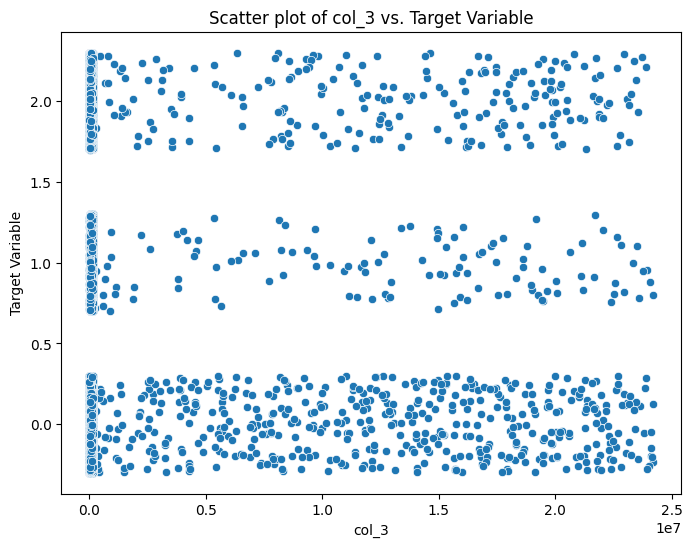

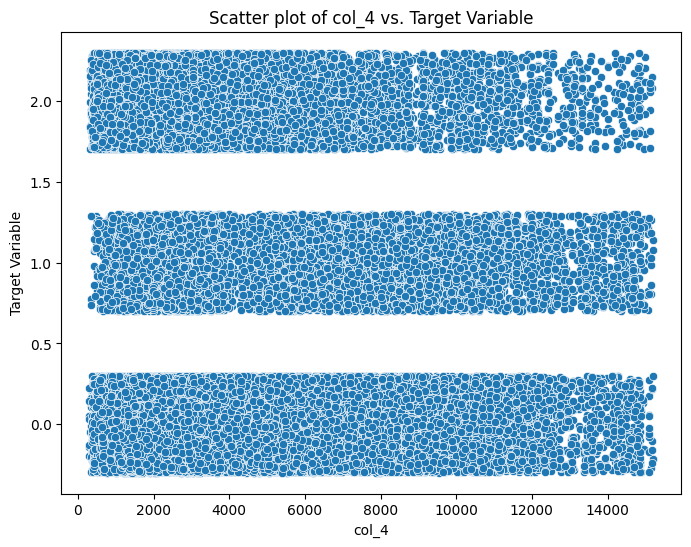

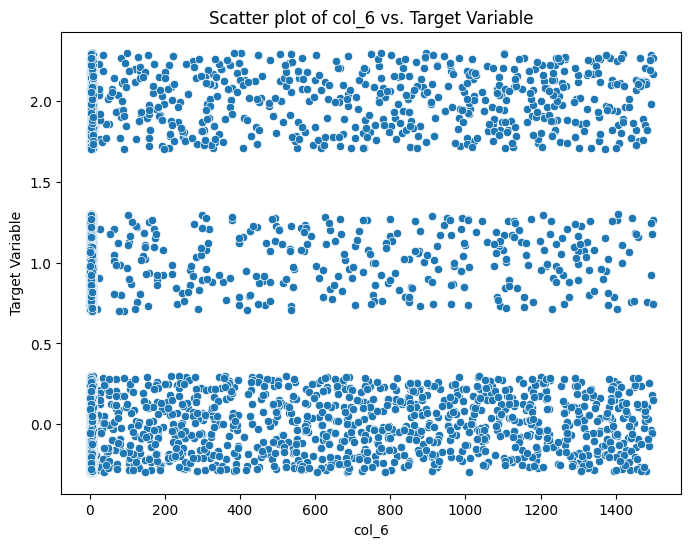

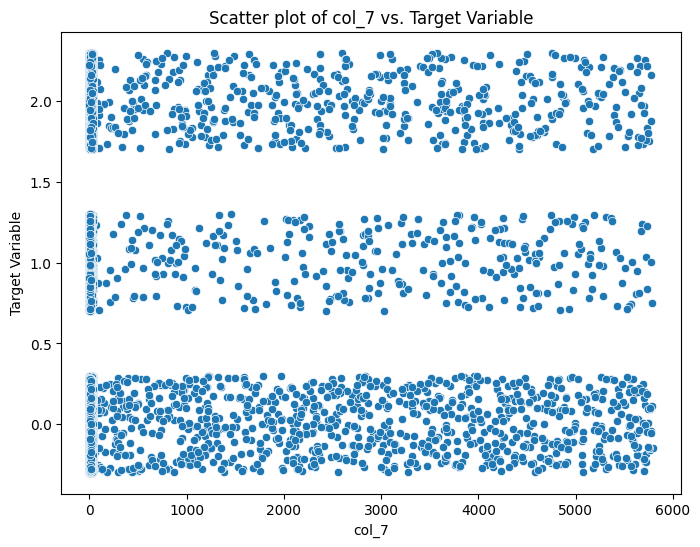

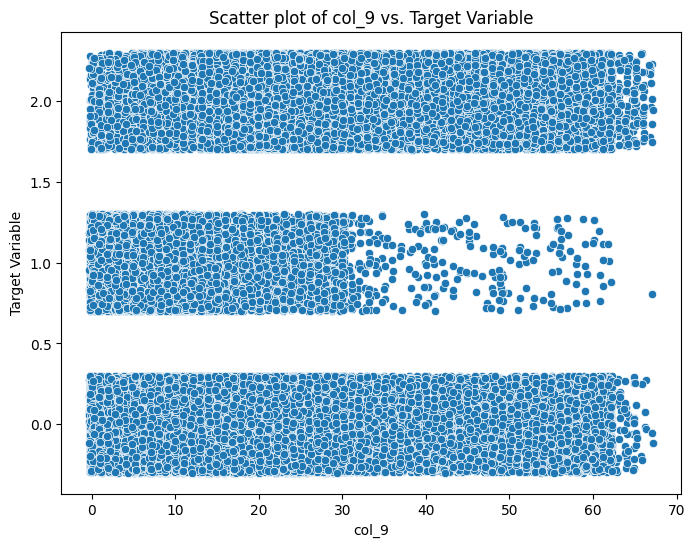

...

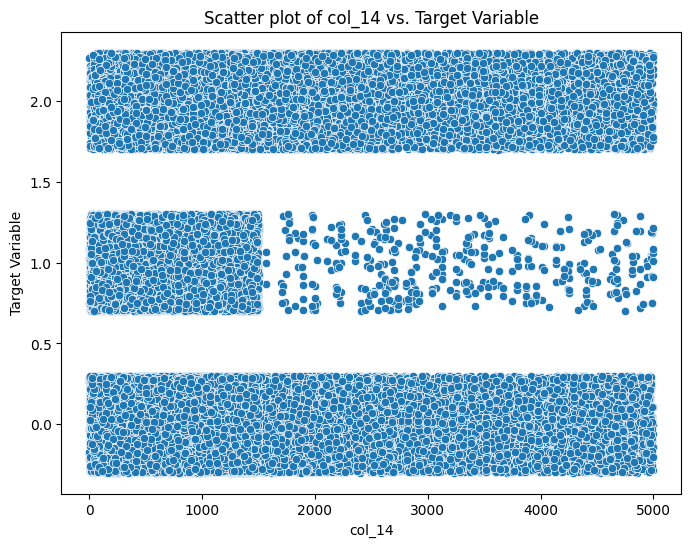

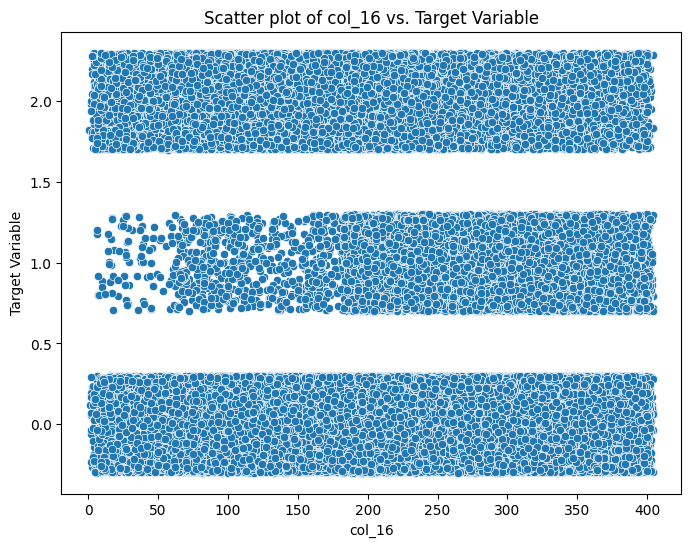

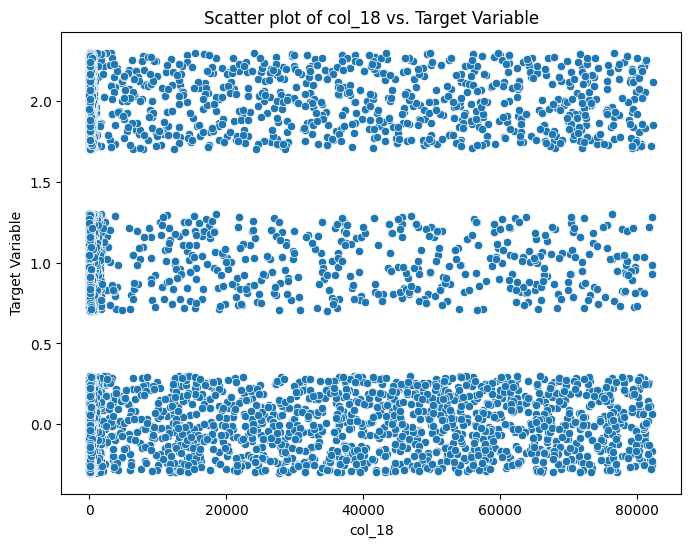

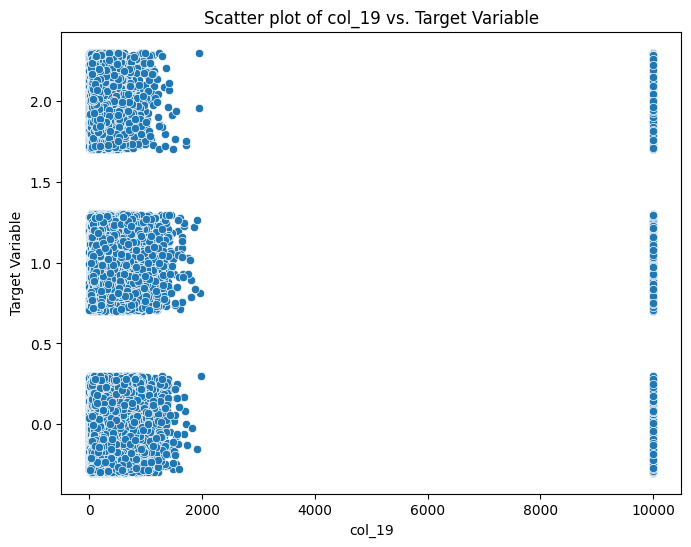

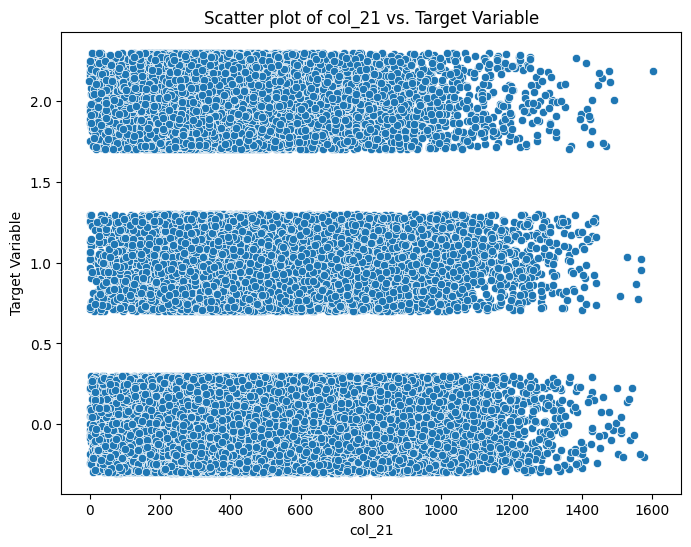

In [112]:
import seaborn as sns
import matplotlib.pyplot as plt  # Import matplotlib for plotting

num = ["col_3", "col_4", "col_6", "col_7", "col_9", "col_11", "col_14", "col_16", "col_18", "col_19", "col_21"]
cat = ["col_2", "col_13", "col_17", "col_20"]

# Loop over numerical features and create scatter plots
for i in num:
    plt.figure(figsize=(8, 6))  # Set the figure size
    sns.scatterplot(x=jitter(ori_df[i]), y=jitter(y))
    plt.title(f"Scatter plot of {i} vs. Target Variable")
    plt.xlabel(i)  # Set x-axis label
    plt.ylabel("Target Variable")  # Set y-axis label
    plt.show()  # Show the plot


<h2> Col: 13

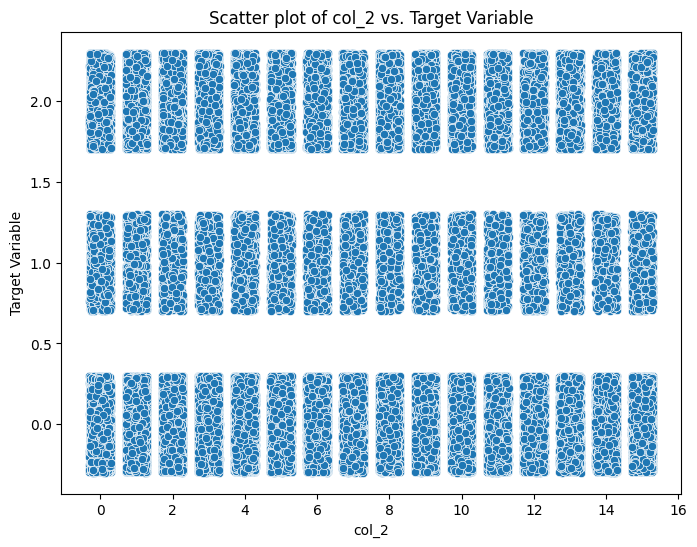

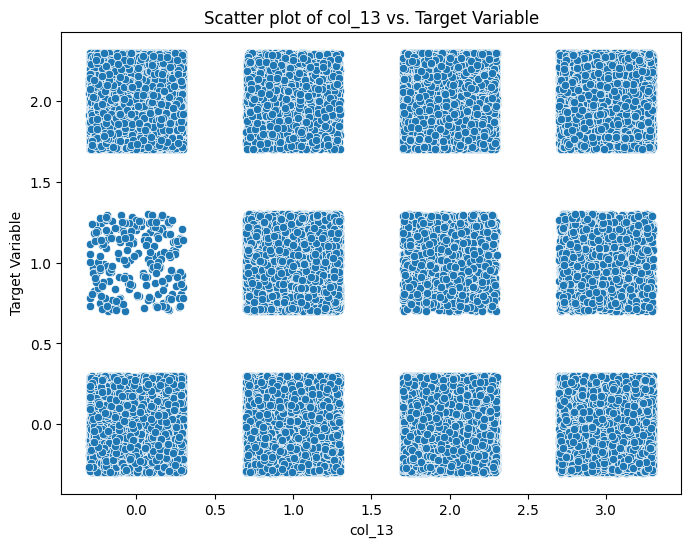

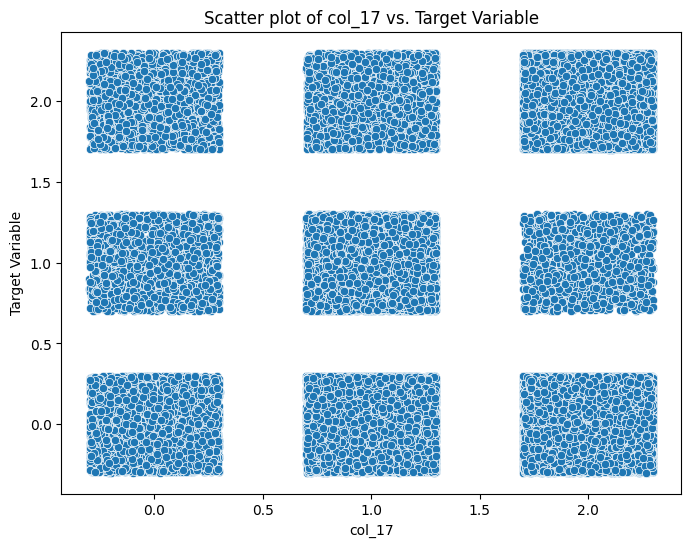

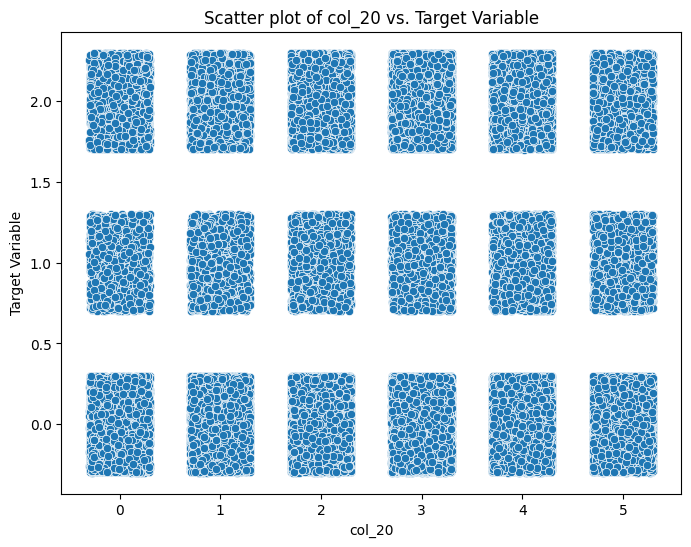

In [111]:
import numpy as np
import random

for i in cat:
    plt.figure(figsize=(8, 6))  # Set the figure size
    sns.scatterplot(x=jitter(ori_df[i]), y=jitter(y))  # Adding jitter to the categorical values
    plt.title(f"Scatter plot of {i} vs. Target Variable")
    plt.xlabel(i)  # Set x-axis label
    plt.ylabel("Target Variable")  # Set y-axis label
    plt.show()  # Show the plot


In [26]:
X_train2 = X_train.drop(["col_1", "col_5", "col_8", "col_10", "col_12", "col_15"],axis=1)
X_test2 = X_test.drop(["col_1", "col_5", "col_8", "col_10", "col_12", "col_15"], axis=1)

## XGBOOST

In [29]:
from sklearn.pipeline import Pipeline            # 用以包裝成pipeline
from sklearn.compose import ColumnTransformer    # 用以整合欄位進行轉換
from sklearn.impute import SimpleImputer         # 用以進行補值前處理
from sklearn.preprocessing import StandardScaler # 用以進行標準化前處理
from sklearn.preprocessing import OneHotEncoder  # 用以進行編碼前處理

In [30]:
from xgboost import XGBClassifier


xgb = Pipeline(steps=[('classifier', XGBClassifier(random_state=42))])

xgb.fit(X_train2, y_train)

Pipeline(steps=[('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None,
                               objective='multi:softprob', ...))])

In [36]:
from sklearn.model_selection import GridSearchCV

param_grid = {"classifier__n_estimators" : [300],
              "classifier__learning_rate" : [0.3],
              "classifier__min_child_weight" : [1],
              "classifier__max_depth" : [9],
              "classifier__subsample" : [0.5],
              "classifier__colsample_bytree" : [1]
              }

grid_xgb = GridSearchCV(xgb, param_grid=param_grid, cv=5)
grid_xgb.fit(X_train2, y_train)


print(f"Best parameters: {grid_xgb.best_params_}")
print(f"Best cross-validation score: {grid_xgb.best_score_:.2f}")

Best parameters: {'classifier__colsample_bytree': 1, 'classifier__learning_rate': 0.3, 'classifier__max_depth': 9, 'classifier__min_child_weight': 1, 'classifier__n_estimators': 300, 'classifier__subsample': 0.5}
Best cross-validation score: 0.76


In [37]:
y_pred = pd.DataFrame(xgb.predict(X_test2))

pred_evalutation(y_test, y_pred)

accuracy
0.74:

recall:
0.74

f1:
0.74



# V3

In [69]:
from sklearn.linear_model import ElasticNet

e_net = ElasticNet(alpha = 1)
e_net.fit(transformed_data, y)

coef=pd.Series(e_net.coef_,index=select_v2_1.columns)
coef

col_3    -4.176448e-09
col_6     2.915769e-06
col_7     8.298306e-07
col_9     4.671041e-03
col_11   -1.343621e-02
col_14    1.689456e-04
col_16   -6.023728e-04
col_18    2.635465e-08
col_13   -0.000000e+00
dtype: float64

In [107]:
num = ["col_9",  "col_11",  "col_14", "col_16"]
cat = ["col_13"]

select_v2_2 = ori_df.loc[:, num+cat]
y = ori_df.iloc[:, -1]

In [99]:
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, num),
        ('cat', categorical_transformer, cat),
    ],
    remainder='passthrough'
    )

pre = Pipeline(steps=[('preprocessor', preprocessor),
                         ])

transformed_data = pre.fit_transform(select_v2_2)
X = pd.DataFrame(transformed_data, columns=num+cat)
X.shape, y.shape

((85270, 5), (85270,))

In [100]:
from imblearn.over_sampling import SMOTE, ADASYN

#X, y = SMOTE().fit_resample(X, y)
X, y = ADASYN().fit_resample(transformed_data, y)

Pipeline(steps=[('pca', PCA(n_components=3)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None,
                               objective='multi:softprob', ...))])

In [56]:
from sklearn.model_selection import GridSearchCV

param_grid = {"classifier__n_estimators" : [300],
              "classifier__learning_rate" : [0.3],
              "classifier__min_child_weight" : [0.5],
              "classifier__max_depth" : [3],
              "classifier__subsample" : [0.5],
              "classifier__colsample_bytree" : [0.5]
              }

grid = GridSearchCV(xgb, param_grid=param_grid, cv=5)
grid.fit(X, y)


print(f"Best parameters: {grid.best_params_}")
print(f"Best cross-validation score: {grid.best_score_:.2f}")

Best parameters: {'classifier__colsample_bytree': 0.5, 'classifier__learning_rate': 0.3, 'classifier__max_depth': 3, 'classifier__min_child_weight': 0.5, 'classifier__n_estimators': 300, 'classifier__subsample': 0.5}
Best cross-validation score: 0.74


In [33]:
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, roc_auc_score, f1_score, roc_curve


def pred_evalutation(y_actu, y_pred):
  #cm = pd.DataFrame(confusion_matrix(y_actu, y_pred), columns=["pred_true", "pred_false"], index=["actual_true", "actual_false"])

  acc = accuracy_score(y_actu, y_pred)
  recall = recall_score(y_actu, y_pred, average='micro')
  #roc_auc = roc_auc_score(y_actu, y_pred, average='micro', multi_class='ovo')
  f1 = f1_score(y_actu, y_pred, average='micro')

  #print(f"Confusion Matrix:\n{cm}\n")
  print(f"accuracy\n{acc:.2f}:\n")
  print(f"recall:\n{recall:.2f}\n")
  #print(f"roc_auc:\n{roc_auc:.2f}\n")
  print(f"f1:\n{f1:.2f}\n")

In [125]:
X_test = pd.read_csv("./data/test.csv")
y_actu = pd.read_csv("./data/random_baseline.csv").loc[:,"label"]


X_test = X_test.loc[:, num+cat]


y_pred = pd.DataFrame(grid.predict(X_test))
pred_evalutation(y_actu, y_pred)

accuracy = accuracy_score(y_actu, y_pred)

accuracy
0.33:

recall:
0.33

f1:
0.33



In [95]:
from sklearn.neighbors import KNeighborsClassifier

kn = Pipeline(steps=[('preprocessor', preprocessor),
                         ('classifier', KNeighborsClassifier(n_neighbors=3))])

kn.fit(X, y)

from sklearn.model_selection import GridSearchCV


param_grid = {}

grid = GridSearchCV(kn, param_grid=param_grid, cv=5)
grid.fit(X, y)


print(f"Best parameters: {grid.best_params_}")
print(f"Best cross-validation score: {grid.best_score_:.2f}")

Best parameters: {}
Best cross-validation score: 0.78


In [126]:
X_test = pd.read_csv("./data/test.csv")
y_actu = pd.read_csv("./data/random_baseline.csv").loc[:,"label"]


X_test = X_test.loc[:, num+cat]


y_pred = pd.DataFrame(grid.predict(X_test))
pred_evalutation(y_actu, y_pred)

accuracy = accuracy_score(y_actu, y_pred)
y_pred

accuracy
0.33:

recall:
0.33

f1:
0.33



,0
0,2
1,0
2,2
3,0
4,0
...,...
6757,2
6758,0
6759,1
6760,0


In [113]:
num = ["col_9",  "col_11",  "col_14", "col_16"]
cat = ["col_13"]

select_v2_2 = ori_df.loc[:, num+cat]
y = ori_df.iloc[:, -1]

In [114]:
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer    # 用以整合欄位進行轉換
from sklearn.impute import SimpleImputer         # 用以進行補值前處理
from sklearn.preprocessing import StandardScaler # 用以進行標準化前處理
from sklearn.preprocessing import OneHotEncoder  # 用以進行編碼前處理
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

numeric_transformer = Pipeline(steps=[
    ("imputer", SimpleImputer(missing_values=np.nan, strategy='median')),
    ("StandardScaler", StandardScaler()),
    ])

categorical_transformer = Pipeline(steps=[
    ("imputer", SimpleImputer(missing_values=np.nan, fill_value="-1")),
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False)),
])


In [120]:
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, num),
        ('cat', categorical_transformer, cat),
    ],
    remainder='passthrough'
    )

pre = Pipeline(steps=[('preprocessor', preprocessor),
                         ])

transformed_data = pre.fit_transform(select_v2_2)
X = pd.DataFrame(transformed_data)



In [122]:
from sklearn.svm import SVC

svc = Pipeline(steps=[
                         ('classifier', SVC())])

svc.fit(X, y)

from sklearn.model_selection import GridSearchCV


param_grid = {}

grid = GridSearchCV(kn, param_grid=param_grid, cv=5)
grid.fit(X, y)


print(f"Best parameters: {grid.best_params_}")
print(f"Best cross-validation score: {grid.best_score_:.2f}")

KeyboardInterrupt: 

<h2> Bin:

  * ❓ 非线性关系：如果数值特征与目标变量之间存在非线性关系，将其分箱可以更好地捕捉到这种关系，提高模型的性能。
  * ✅ 稀疏性：如果特征的取值范围较大，而且数据较为稀疏，分箱可以帮助模型更好地处理这些数据，提高模型的泛化能力。
  * ✅ 模型复杂度：分箱可以降低模型的复杂度，避免过拟合，尤其是在数据量不足或特征维度较高的情况下。
  * 解释性：分箱可以增加模型的可解释性，因为它将连续特征转换为离散特征，更容易理解和解释模型的预测结果。

In [ ]:
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer    # 用以整合欄位進行轉換
from sklearn.impute import SimpleImputer         # 用以進行補值前處理
from sklearn.preprocessing import StandardScaler # 用以進行標準化前處理
from sklearn.preprocessing import OneHotEncoder  # 用以進行編碼前處理
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import LabelEncoder

numeric_transformer = Pipeline(steps=[
    ("imputer", SimpleImputer(missing_values=np.nan, strategy='median')),
    ("StandardScaler", StandardScaler()),
    ("LabelEncoder", LabelEncoder())
    ])

categorical_transformer = Pipeline(steps=[
    ("imputer", SimpleImputer(missing_values=np.nan, fill_value="-1")),
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False)),
    ('PCA', PCA()),
])

In [ ]:
for n in num:
  pd.qcut(v1_df[n], 5)

# Submission

In [ ]:
X_test = pd.read_csv("./data/test.csv")

pred = grid.predict(X_test)

with open('predict3.csv', 'w') as f:
    f.write('Id,label\n')
    for i in range(len(pred)): #len(pred)看整個test有多長，然後用for去跑全部
        f.write(str(i) + ',' + str(int(pred[i])) + '\n')